# LDA Topic Modelling in Python: Example 2, Part 1

This notebook is a use case of Gensim’s LDA model based on the [GitHub Topic Modelling Textbook](https://github.com/wjbmattingly/topic_modeling_textbook/blob/main/02_03_setting_up_tf_idf.ipynb) posted by wjbmattingly.

The first bit of data used in this lesson is a collection of descriptions of violence from apartheid South Africa from the 20th century, and the document is known as the Volume 7 of the TRC Final Report. 

## Preparing the data

In [7]:
import json


def load_data(file):
    with open (file, "r", encoding="utf-8") as f:
        data = json.load(f) 
    return (data)

trc_data = load_data("trc_dn.json")
names = trc_data["names"]
descriptions = trc_data["descriptions"]

print ("Name Example:", names[0])
print ("Description Example:", descriptions[0], "\n")
print ("Name count:", len(names))
print ("Description count", len(descriptions))

Name Example: AARON, Thabo Simon
Description Example: An ANCYL member who was shot and severely injured by SAP members at Lephoi, Bethulie, Orange Free State (OFS) on 17 April 1991. Police opened fire on a gathering at an ANC supporter's house following a dispute between two neighbours, one of whom was linked to the ANC and the other to the SAP and a councillor. 

Name count: 21747
Description count 21747


## Cleaning the Data

In [12]:
import string
from nltk.corpus import stopwords
import re

def remove_stops(text, stops):
    #uses regex to remove all AC numbers
    text = re.sub(r"AC\/\d{1,4}\/\d{1,4}", "", text)
    
    #removes all stop words, including months
    words = text.split()
    final = []
    for word in words:
        if word not in stops:
            final.append(word)
            
    #reassembles the text without stop words
    final = " ".join(final)
    
    #removes all punctuation
    final = final.translate(str.maketrans("", "", string.punctuation))
    
    #removes all numbers
    final = "".join([i for i in final if not i.isdigit()])
    
    #eliminates double white spaces
    while "  " in final:
        final = final.replace("  ", " ")
    return (final)

def clean_docs(docs):
    #gets the NLTK's stopword list for English
    stops = stopwords.words("english")
    
    #Grabs all the months from data/months.json
    months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
    
    #combines the two to make a master stopword list
    stops = stops+months
    
    #empty new list to store the cleaned docs
    final = []
    
    #iterate over all docs and cleans them to be a
    #single sentence with no unwanted words
    for doc in docs:
        clean_doc = remove_stops(doc, stops)
        final.append(clean_doc)
    
    return (final)

In [14]:
cleaned_docs = clean_docs(descriptions)

print ("Original Text:")
print (descriptions[0]+"\n")

print ("Cleaned Text:")
print (cleaned_docs[0])

Original Text:
An ANCYL member who was shot and severely injured by SAP members at Lephoi, Bethulie, Orange Free State (OFS) on 17 April 1991. Police opened fire on a gathering at an ANC supporter's house following a dispute between two neighbours, one of whom was linked to the ANC and the other to the SAP and a councillor.

Cleaned Text:
An ANCYL member shot severely injured SAP members Lephoi Bethulie Orange Free State OFS Police opened fire gathering ANC supporters house following dispute two neighbours one linked ANC SAP councillor


## TF-IDF Vectorizer

In [15]:
# A lot of this section comes from the Scikit Learn documentation and various blogs including the following:
#https://towardsdatascience.com/applying-machine-learning-to-classify-an-unsupervised-text-document-e7bb6265f52
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

**TF-IDF Parameters:**

- lowercase => allows us to lowercase our data.
- max_features => this is how many words out of the entire corpus we want to take into account. Here, we will use 100. The higher the number, the more computational expensive the tasks are to run. I have chosen 100 for this demonstration somewhat at random, but it works fairly well for our purposes.
- max_df => this is a float that tells the algorithm to ignore any word that occurs in 80% of the documents.
- min_df => this is an integer that tells the algorithm to ignore words that do not occur more than 5 times in the entire corpus.
- ngram_range => this is a tuple with index 0 being the smallest number of words to consider with the second index being the largest, i.e. 2 for bigram and 3 for trigrams. (1, 3) means the algorithm should consider anything from a unigram (one word) to trigram (three words) as a concept.
- stop_words => this is the language you are working with and you are telling the algorithm to ignore the predefined set of stopwords. This is a bit excessive since we already did this with NLTK.

In [16]:
vectorizer = TfidfVectorizer(
                                lowercase=True,
                                max_features=100,
                                max_df=0.8,
                                min_df=5,
                                ngram_range = (1,3),
                                stop_words = "english"

                            )

vectors = vectorizer.fit_transform(cleaned_docs)

#### Gertting the feature names

In [19]:
feature_names = vectorizer.get_feature_names_out()
print (feature_names[0])

allegedly


#### Matrix transformations -> density & keywords

In [23]:
dense = vectors.todense()
denselist = dense.tolist()
print (denselist[0])

[0.0, 0.0, 0.35997263491995035, 0.0, 0.0, 0.31417904033665145, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.26764577237075254, 0.0, 0.0, 0.0, 0.0, 0.24755257133949066, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.28809076545860496, 0.20314225251689294, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.27507572242905154, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5249891606885219, 0.0, 0.0, 0.3047379292177127, 0.0, 0.19595009171387526, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.17885669660417403, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


In [25]:
all_keywords = []
for description in denselist:
    x=0
    keywords = []
    for word in description:
        if word > 0:
            keywords.append(feature_names[x])
        x=x+1
    all_keywords.append(keywords)
    
    
print ("Original Text:")
print (descriptions[0]+"\n")

print ("Cleaned Text:")
print (cleaned_docs[0]+"\n")

print ("Only Keywords Text:")
print (all_keywords[0])

Original Text:
An ANCYL member who was shot and severely injured by SAP members at Lephoi, Bethulie, Orange Free State (OFS) on 17 April 1991. Police opened fire on a gathering at an ANC supporter's house following a dispute between two neighbours, one of whom was linked to the ANC and the other to the SAP and a councillor.

Cleaned Text:
An ANCYL member shot severely injured SAP members Lephoi Bethulie Orange Free State OFS Police opened fire gathering ANC supporters house following dispute two neighbours one linked ANC SAP councillor

Only Keywords Text:
['anc', 'anc supporters', 'house', 'injured', 'member', 'members', 'police', 'sap', 'severely', 'shot', 'supporters']


## K-Means Clustering

In [26]:
true_k = 5 # look for 5 clusters

model = KMeans(n_clusters=true_k, 
               init="k-means++", 
               max_iter=100, 
               n_init=1)

In [28]:
model.fit(vectors)

order_centroids = model.cluster_centers_.argsort()[:, ::-1]
# print (order_centroids)

terms = vectorizer.get_feature_names_out()
# print (terms[92])

In [36]:
# printing 10 words from each cluster

i = 0
for cluster in order_centroids:
    print (f"Cluster {i}")
    for keyword in cluster[0:10]:
        print (terms[keyword])
    print ("")
    i=i+1

Cluster 0
ifp
supporters
anc
natal
ifp supporters
supporter
anc supporter
shot
conflict
anc supporters

Cluster 1
amnesty
mk
granted
operatives
granted amnesty
injured
mk operatives
killed
people
security

Cluster 2
durban
inkatha
supporters
near
near durban
kwazulu
burnt
kwazulu near
kwazulu near durban
inkatha supporters

Cluster 3
members
sap
shot
members sap
police
cape
member
detained
dead
shot dead

Cluster 4
beaten
severely beaten
severely
members
police
sap
members sap
bophuthatswana
cape
supporter



## Plotting the data

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [38]:
kmean_indices = model.fit_predict(vectors)

pca = PCA(n_components=2)
scatter_plot_points = pca.fit_transform(vectors.toarray())

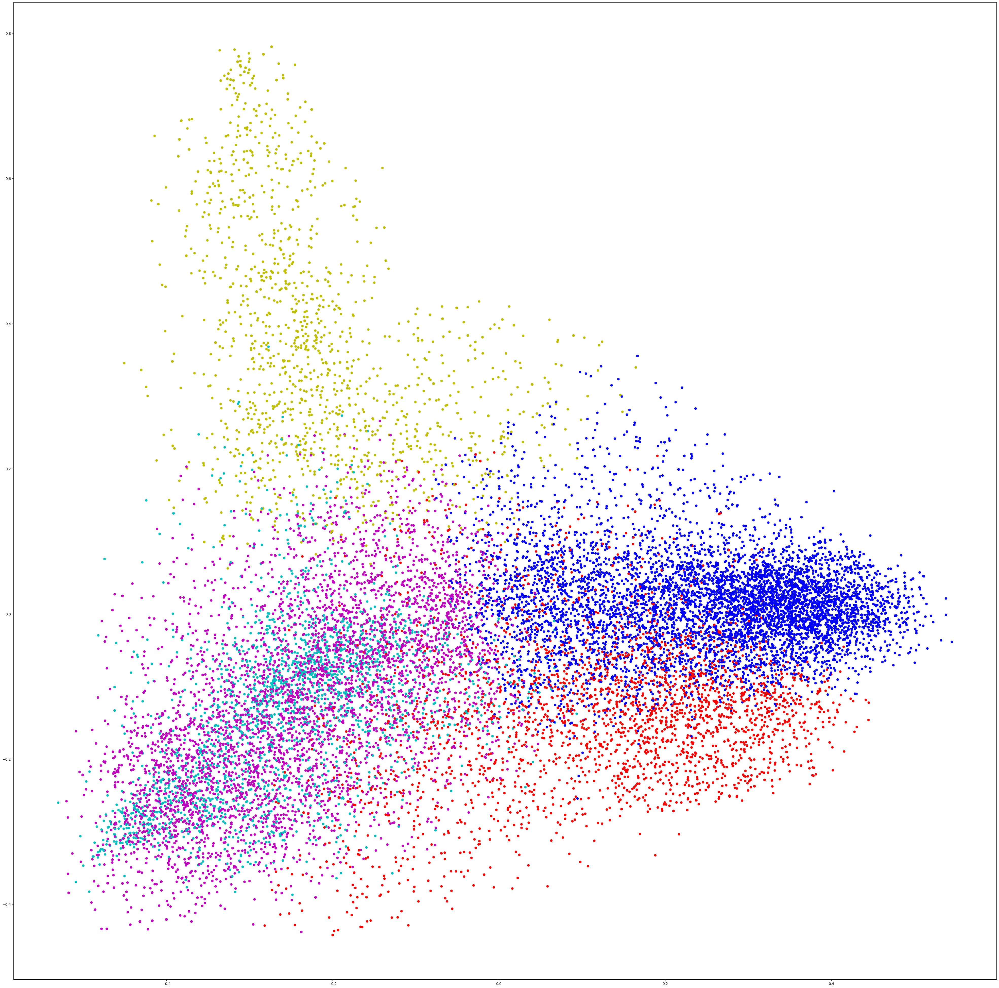

In [41]:
colors = ["r", "b", "m", "y", "c"]

x_axis = [o[0] for o in scatter_plot_points]
y_axis = [o[1] for o in scatter_plot_points]

fig, ax = plt.subplots(figsize=(50, 50))
ax.scatter(x_axis, y_axis, c=[colors[d] for d in kmean_indices]);

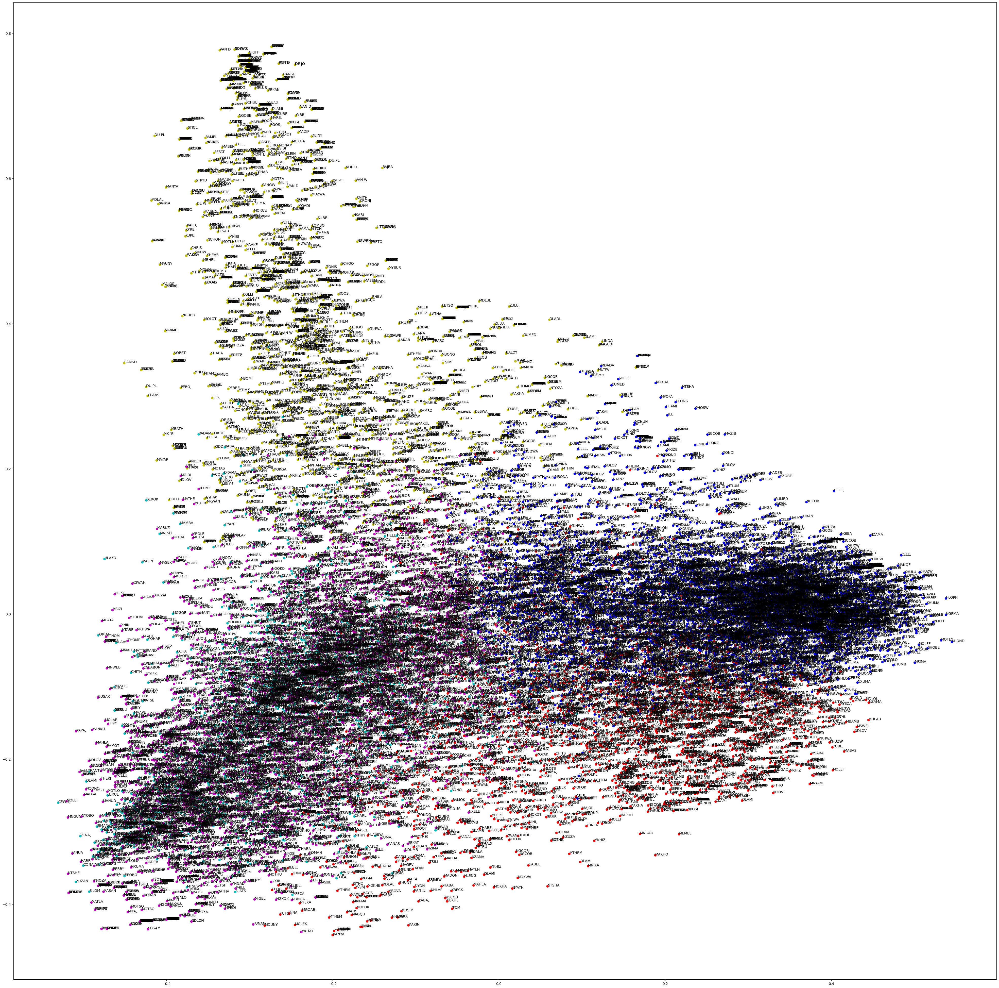

In [42]:
fig, ax = plt.subplots(figsize=(50, 50))
ax.scatter(x_axis, y_axis, c=[colors[d] for d in kmean_indices])
for i, txt in enumerate(names):
    ax.annotate(txt[0:5], (x_axis[i], y_axis[i]))
